# Cloud Shadows Projection

This notebook demonstrates how to project cloud shadows from a cloud mask. The cloud mask is derived from the s2cloudless Sentinel-2 cloud detector, and the cloud masks are projected using the solar geometry information available in the product's metadata.

This is a notebook to follow along the blog post on cloud shadow projection.

The overview of the notebook is as follows:
1. Download data (bands, DEM, solar angles, ...), run cloud detection to produce cloud masks
2. Calculate the cloud shadow candidates from a luminosity image
3. Project the cloud mask and determine the cloud height parameter by alignment of the masks
4. Post-process the obtained cloud shadow mask to improve it further

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import multiprocessing

multiprocessing.set_start_method("fork", force=True)

import datetime as dt
import os

import matplotlib.pyplot as plt
import numpy as np
from utils import (
    connected_components_filter,
    dilate_mask,
    get_edge_mask,
    get_hillshade_mask,
    get_water_mask,
    iou,
    project_cloud_mask,
)

from eolearn.core import EOPatch, FeatureType
from eolearn.io import SentinelHubDemTask, SentinelHubInputTask
from eolearn.mask.extra.cloud_mask import CloudMaskTask
from sentinelhub import DataCollection, Geometry

# 1. Data Download and Cloud Mask Calculation

In [3]:
# Sentinel-2 L1C download task (bands, angles, data mask)
download_task_func = SentinelHubInputTask(
    data_collection=DataCollection.SENTINEL2_L1C,
    bands_feature=(FeatureType.DATA, "BANDS"),
    additional_data=[
        (FeatureType.DATA, "sunAzimuthAngles"),
        (FeatureType.DATA, "sunZenithAngles"),
        (FeatureType.DATA, "viewAzimuthMean"),
        (FeatureType.DATA, "viewZenithMean"),
        (FeatureType.MASK, "dataMask"),
    ],
    max_threads=5,
    resolution=10,
)

# Sentinel-2 L2A download task (RGB, SCL)
# SCL is the Scene Classification Layer which also contains cloud shadow information, we can use it for comparison
download_scl_task_func = SentinelHubInputTask(
    data_collection=DataCollection.SENTINEL2_L2A,
    bands_feature=(FeatureType.DATA, "RGB"),
    bands=["B04", "B03", "B02"],
    additional_data=[(FeatureType.DATA, "SCL")],
    max_threads=5,
    resolution=10,
)

# Copernicus Digital Elevation Model (DEM) download task
download_dem_task_func = SentinelHubDemTask(
    data_collection=DataCollection.DEM_COPERNICUS_30,
    feature=(FeatureType.DATA_TIMELESS, "DEM"),
    max_threads=5,
    resolution=10,
)

# Cloud mask task
cloud_mask_task = CloudMaskTask(
    data_feature=(FeatureType.DATA, "BANDS"),
    valid_data_feature=(FeatureType.MASK, "dataMask"),
    output_mask_feature=(FeatureType.MASK, "CLM"),
    output_proba_feature=(FeatureType.DATA, "CLP"),
    average_over=2,
    dilation_size=1,
    threshold=0.4,
)

In [4]:
# define timestamp and geometry
timestamp = dt.datetime(2017, 12, 18, 11, 20, 50)
geojson = {
    "crs": {"type": "name", "properties": {"name": "urn:ogc:def:crs:EPSG::32629"}},
    "type": "Polygon",
    "coordinates": [
        [
            [658871.2730891018, 3411869.9656827217],
            [658871.2730891018, 3431869.9656827217],
            [678871.2730891018, 3431869.9656827217],
            [678871.2730891018, 3411869.9656827217],
            [658871.2730891018, 3411869.9656827217],
        ]
    ],
}
bbox = Geometry.from_geojson(geojson).bbox

# download data using the tasks or load from disk
eop_path = "./eopatch"
if not os.path.exists(eop_path):
    eop = download_task_func(bbox=bbox, time_interval=timestamp)
    eop = download_scl_task_func(eop)
    eop = download_dem_task_func(eop)
    eop = cloud_mask_task(eop)
    eop.save(eop_path)
else:
    eop = EOPatch.load(eop_path)

### Plot data and cloud mask

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


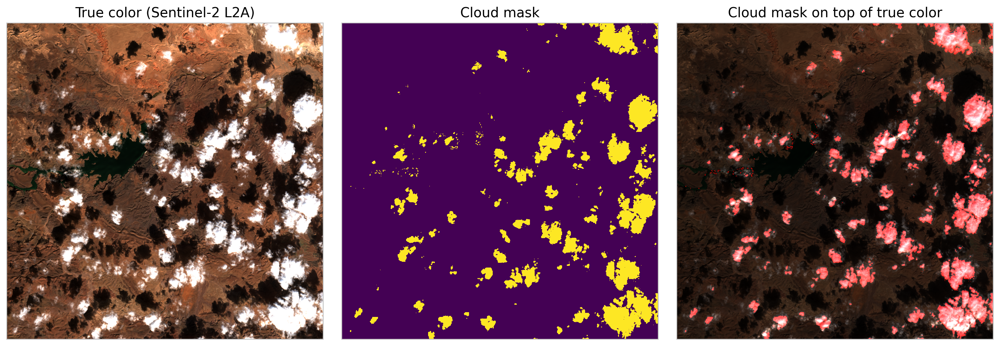

In [5]:
plt.style.use(["default", "bmh"])
fig, axr = plt.subplots(figsize=(15, 5), ncols=3, dpi=200)
fig.patch.set_alpha(1)

rgb = eop.data["RGB"][0].copy() * 2.5
clm = eop.mask["CLM"][0][..., 0]

masked_rgb = rgb.copy() / 2.5
masked_rgb[clm == 1] += [0.75, 0, 0]

add_titles = False

axr[0].imshow(rgb)
axr[0].set_xticks([])
axr[0].set_yticks([])

axr[1].imshow(clm, vmin=0, vmax=1, interpolation="none")
axr[1].set_xticks([])
axr[1].set_yticks([])

axr[2].imshow(masked_rgb)
axr[2].set_xticks([])
axr[2].set_yticks([])

axr[0].set_title("True color (Sentinel-2 L2A)")
axr[1].set_title("Cloud mask")
axr[2].set_title("Cloud mask on top of true color")

plt.tight_layout()

# 2. Determining the Cloud Shadow Candidates Mask

In the firs part of this section we will define the luminosity mask as the root-mean-square (RMS) of the Sentinel-2 L1C bands. To threshold the mask, we will remove everything below (above) the 1st (99th) percentile, and decide on a value in this range as a threshold.

After that, we will define the hillshade mask and the water mask to remove dark regions due to topography and water bodies. This will make our cloud shadow candidate mask a bit more reliable.

In the final step we will post-process the cloud shadow candidate mask by removing connected regions of pixels which are below some size, which will help remove the noise.

In [6]:
bands = eop.data["BANDS"][0]
valid = eop.mask["dataMask"][0].squeeze(-1)
luminosity = np.mean(np.square(bands), axis=-1) ** 0.5

# determine the valid range of luminosity values
lum_range = np.percentile(luminosity[valid & ~clm], [1, 99])

# determine the threshold for the luminosity mask
range_thr = 0.15
lum_thr = lum_range[0] + (lum_range[1] - lum_range[0]) * range_thr
dark_pixels = luminosity < lum_thr

In [7]:
# determine the hillshade mask, dilate with dilation size 4
hsm = get_hillshade_mask(eop, 0, 4)
water_mask = get_water_mask(eop, 0, 4)

# combine the masks into the cloud shadow candidates mask
filter_mask = ~clm & ~water_mask & ~hsm & valid  # filter out clouds, water, hillshade and invalid pixels
raw_mask = dark_pixels & filter_mask
raw_mask = connected_components_filter(raw_mask, 50)  # filter out connected components smaller than 50 pixels
cloud_shadow_candidates = raw_mask > 0

# add to eopatch
eop[FeatureType.MASK, "HSM"] = hsm[np.newaxis, ..., np.newaxis]
eop[FeatureType.MASK, "WATER_MASK"] = water_mask[np.newaxis, ..., np.newaxis]
eop[FeatureType.MASK, "CLS_CAND"] = cloud_shadow_candidates[np.newaxis, ..., np.newaxis]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


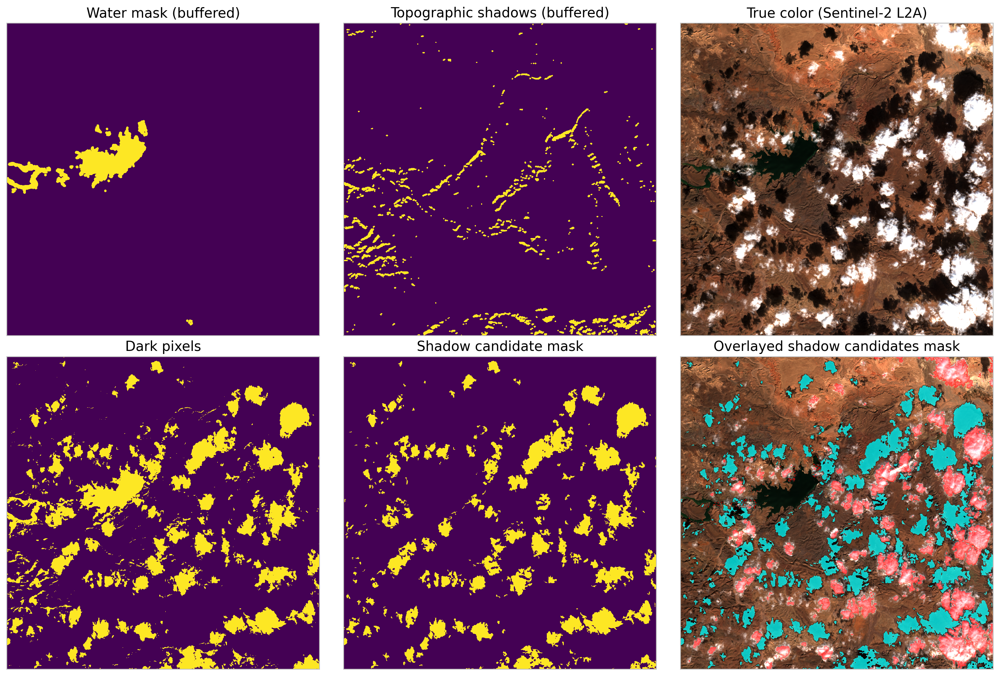

In [8]:
# plot everything
plt.style.use(["default", "bmh"])
fig, axr = plt.subplots(figsize=(15, 10), ncols=3, nrows=2, dpi=200, subplot_kw={"xticks": [], "yticks": []})
fig.patch.set_alpha(1)

masked_rgb = rgb.copy()
masked_rgb[clm == 1] /= 2.5
masked_rgb[clm == 1] += [0.75, 0, 0]
masked_rgb[cloud_shadow_candidates == 1, 1:] += 0.75

axr[0, 0].imshow(water_mask, vmin=0, vmax=1, interpolation="none")
axr[0, 0].set_title("Water mask (buffered)")

axr[0, 1].imshow(hsm, vmin=0, vmax=1, interpolation="none")
axr[0, 1].set_title("Topographic shadows (buffered)")

axr[0, 2].imshow(rgb)
axr[0, 2].set_title("True color (Sentinel-2 L2A)")

axr[1, 0].imshow(dark_pixels, interpolation="none")
axr[1, 0].set_title("Dark pixels")

axr[1, 1].imshow(cloud_shadow_candidates, interpolation="none")
axr[1, 1].set_title("Shadow candidate mask")

axr[1, 2].imshow(masked_rgb, interpolation="none")
axr[1, 2].set_title("Overlayed shadow candidates mask")

plt.tight_layout()

# 3. Projection of Cloud Masks

For projecting the mask we will use the prepared function `project_cloud_mask` from the `utils.py` file, which takes the cloud mask and projects it to the ground according to the solar angles.

The next step will be finding out what are the best parameters for the cloud height

In [9]:
def cloud_height_metric(height: float, eop: EOPatch, t_idx: int) -> float:
    """Function to evaluate the IoU metric for a given cloud height"""
    projected, *_ = project_cloud_mask(eop, t_idx, height)
    candidates = eop.mask["CLS_CAND"][t_idx].squeeze(-1)
    return iou(projected, candidates)


# find the optimal cloud height
height_list = [h for h in range(0, 3000, 30)]
iou_list = [cloud_height_metric(h, eop, 0) for h in height_list]
opt_height = height_list[np.argmax(iou_list)]

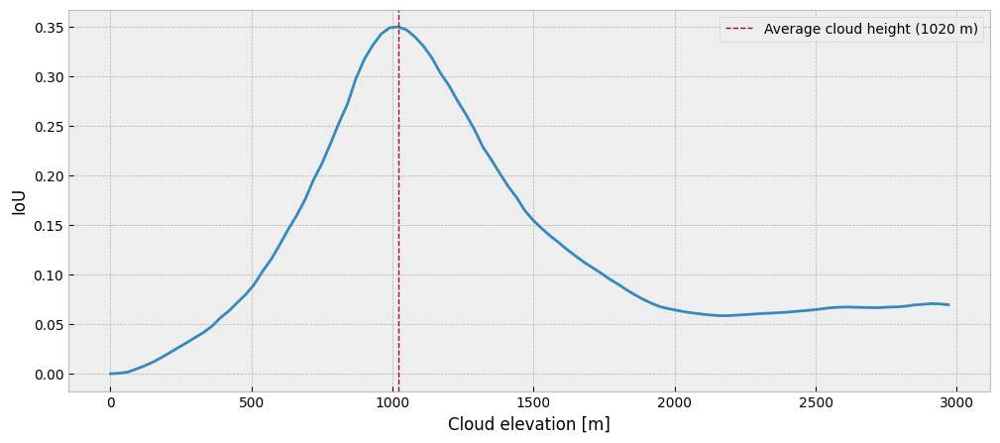

In [10]:
plt.style.use(["default", "bmh"])
fig, ax = plt.subplots(figsize=(12, 5))
fig.patch.set_alpha(1)

ax.plot(height_list, iou_list)
ax.axvline(opt_height, color="C1", lw=1, ls="--", label=f"Average cloud height ({opt_height} m)")

ax.set_xlabel("Cloud elevation [m]")
ax.set_ylabel("IoU")
ax.legend()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


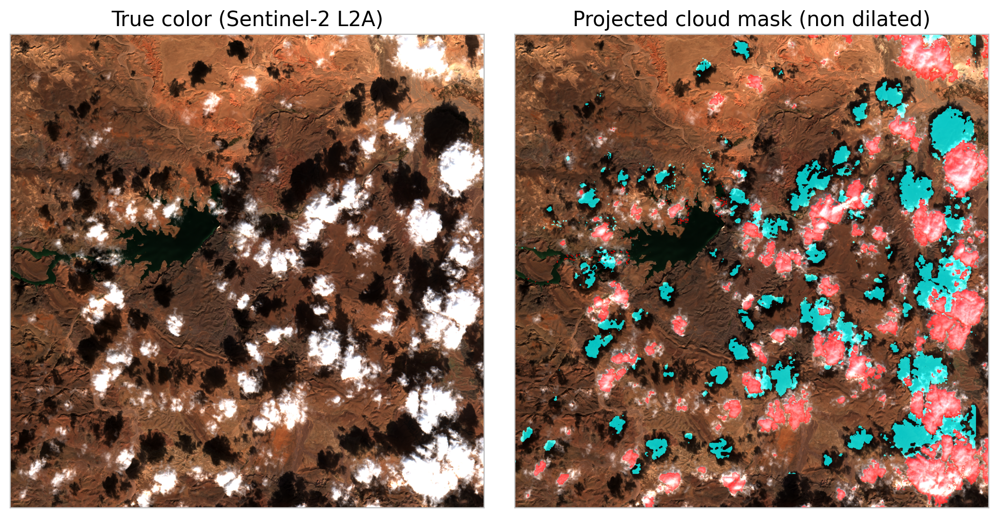

In [11]:
plt.style.use(["default", "bmh"])
fig, axs = plt.subplots(ncols=2, figsize=(10, 5), dpi=200, subplot_kw={"xticks": [], "yticks": []})
fig.patch.set_alpha(1)

projected, *_ = project_cloud_mask(eop, 0, opt_height)

axs[0].imshow(rgb)
axs[0].set_title("True color (Sentinel-2 L2A)")

masked_rgb = rgb.copy()
masked_rgb[clm == 1] /= 2.5
masked_rgb[clm == 1] += [0.75, 0, 0]
masked_rgb[projected == 1, 1:] += 0.75
axs[1].imshow(masked_rgb)
axs[1].set_title("Projected cloud mask (non dilated)")

plt.tight_layout()

# 4.0 Post-processing of the cloud shadow mask

The cloud shadow mask is now already pretty good, but we still see there are some problematic parts with it:
- the mask doesn't completely cover the shadow areas
- the edges opposite to the projection direction may contain shadows of clouds outside of the image

In this section we will tackle each part separately

## 4.1 Buffering the cloud shadow mask

In [12]:
def dilation_size_metric(dilation_size: int, eop: EOPatch, t_idx: int, height: float) -> float:
    """Function to evaluate the IoU metric for a given dilation size"""
    projected, *_ = project_cloud_mask(eop, t_idx, height)
    candidates = eop.mask["CLS_CAND"][t_idx].squeeze(-1)
    return iou(dilate_mask(projected, dilation_size), candidates)


# find the optimal dilation size
dilation_list = [d for d in range(0, 31)]
iou_list = [dilation_size_metric(d, eop, 0, opt_height) for d in dilation_list]
opt_dilation = dilation_list[np.argmax(iou_list)]

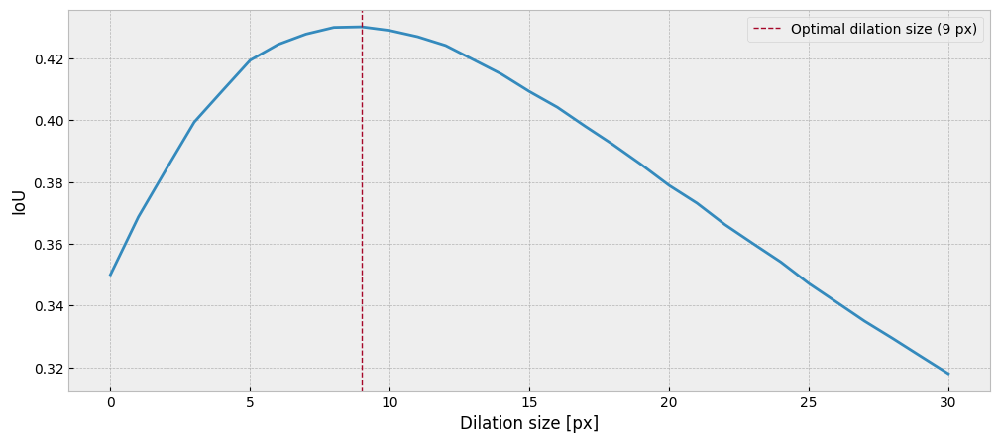

In [13]:
plt.style.use(["default", "bmh"])
fig, ax = plt.subplots(figsize=(12, 5))
fig.patch.set_alpha(1)

ax.plot(dilation_list, iou_list)
ax.axvline(opt_dilation, color="C1", lw=1, ls="--", label=f"Optimal dilation size ({opt_dilation} px)")

ax.set_xlabel("Dilation size [px]")
ax.set_ylabel("IoU")
ax.legend()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


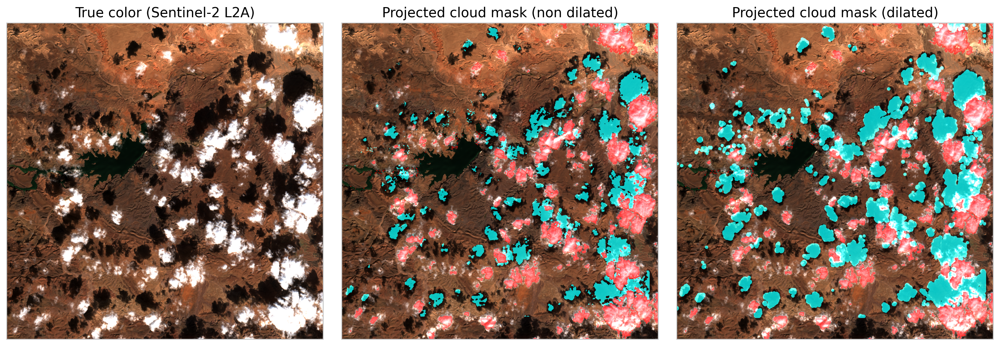

In [14]:
plt.style.use(["default", "bmh"])
fig, axs = plt.subplots(ncols=3, figsize=(15, 5), dpi=200, subplot_kw={"xticks": [], "yticks": []})
fig.patch.set_alpha(1)

projected_non_dilated, *_ = project_cloud_mask(eop, 0, opt_height)
projected = dilate_mask(projected_non_dilated, opt_dilation)

axs[0].imshow(rgb)
axs[0].set_title("True color (Sentinel-2 L2A)")

masked_rgb = rgb.copy()
masked_rgb[clm == 1] /= 2.5
masked_rgb[clm == 1] += [0.75, 0, 0]
masked_rgb[projected_non_dilated == 1, 1:] += 0.75
axs[1].imshow(masked_rgb)
axs[1].set_title("Projected cloud mask (non dilated)")

masked_rgb = rgb.copy()
masked_rgb[clm == 1] /= 2.5
masked_rgb[clm == 1] += [0.75, 0, 0]
masked_rgb[projected == 1, 1:] += 0.75
axs[2].imshow(masked_rgb)
axs[2].set_title("Projected cloud mask (dilated)")

plt.tight_layout()

## 4.2 Shadows of clouds outside of the image

Here we can make use of the offset parameters used in the projection to define the region where the potential cloud shadows from clouds outside of the image may lie.

When this region is defined, we simply intersect it with our cloud shadow candidate mask and apply the buffer to make the correction

In [15]:
shadow_candidate_mask = eop.mask["CLS_CAND"][0].squeeze(-1)
projected, cols_off, rows_off = project_cloud_mask(eop, 0, opt_height)
projected = dilate_mask(projected, opt_dilation)

# get the edge area mask
edge_offset_mask = get_edge_mask(cols_off, rows_off, clm.shape)

# intersect with the shadow candidate mask and dilate
edge_offset_candidates = edge_offset_mask & shadow_candidate_mask
edge_offset_candidates = dilate_mask(edge_offset_candidates, opt_dilation)
edge_offset_candidates &= ~clm  # remove cloud areas

# combine the projected and edge offset candidates masks
cloud_shadows = projected | edge_offset_candidates

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


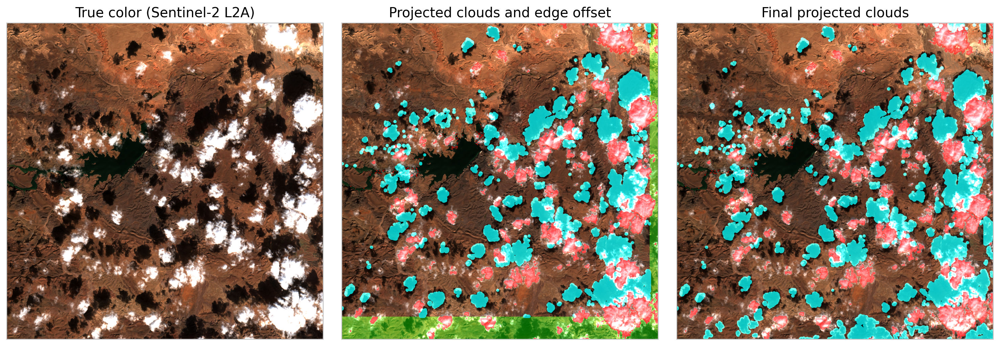

In [16]:
plt.style.use(["default", "bmh"])
fig, axr = plt.subplots(figsize=(15, 5), ncols=3, dpi=200, subplot_kw={"xticks": [], "yticks": []})
fig.patch.set_alpha(1)

axr[0].imshow(rgb)

out = rgb.copy()
out[clm] /= 2.5
out[clm, 0] += 0.75
out[projected, 1:] += 0.75
out[edge_offset_mask & ~projected & ~clm, 1] += 0.4
axr[1].imshow(np.clip(out, 0, 1))

out = rgb.copy()
out[clm] /= 2.5
out[clm, 0] += 0.75
out[cloud_shadows, 1:] += 0.75
axr[2].imshow(np.clip(out, 0, 1))

axr[0].set_title("True color (Sentinel-2 L2A)")
axr[1].set_title("Projected clouds and edge offset")
axr[2].set_title("Final projected clouds")

plt.tight_layout()

And that's it!

Now you know how to detect cloud shadows in Sentinel-2 images. You can use the code provided in this tutorial to detect cloud shadows in your own images. If you have any questions or comments, please let us know in the comments, or start a conversation at our [Sentinel Hub Forum](https://forum.sentinel-hub.com/).